<a href="https://colab.research.google.com/github/isabelgilchristmiller/QCES/blob/main/Project3_tsunami.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 3: Tsunami
In this project, we will use Dedalus to model the propagation of Tsunami waves. Tsunami typically have wavelengths larger than 100km and periods of about 1 hour. Since their wavelength is much larger than the depth of the ocean, Tsunami can be modelled using the shallow water equations.

Here, we will use Dedalus to solve an initial value problem for the shallow water equations. We will generate a Tsunami using a localized disturbance to the water height.

Student tasks are in [Section 1.3]( #section1pt3 ), [Section 2.3]( #section2pt3 ), and [Section 3.3]( #section3pt3 ).

## Setup
If you are using Google colab, run the script below to install Dedalus

In [1]:
# Set environment variables for best performance
%env OMP_NUM_THREADS=1
%env NUMEXPR_MAX_THREADS=1

# Minimize logging output
import logging
logging.disable(logging.DEBUG)

# Check if running on google colab
import os
using_google_colab = bool(os.getenv("COLAB_RELEASE_TAG"))

# Check for Dedalus
try:
    import dedalus.public as de
    print("Dedalus already installed :)")
except:
    print("Dedalus not installed yet.")
    if using_google_colab:
        print("Installing for Google Colab.")
        print()
        # Step 1: Install FFTW
        !apt-get install libfftw3-dev
        !apt-get install libfftw3-mpi-dev
        # Step 2: Set paths for Dedalus installation
        import os
        os.environ['MPI_INCLUDE_PATH'] = "/usr/lib/x86_64-linux-gnu/openmpi/include"
        os.environ['MPI_LIBRARY_PATH'] = "/usr/lib/x86_64-linux-gnu"
        os.environ['FFTW_INCLUDE_PATH'] = "/usr/include"
        os.environ['FFTW_LIBRARY_PATH'] = "/usr/lib/x86_64-linux-gnu"
        # Step 3: Install Dedalus using pip
        !pip3 install cython "mpi4py<4.0" numpy setuptools wheel
        !CC=mpicc pip3 install --no-cache --no-build-isolation http://github.com/dedalusproject/dedalus/zipball/master/
        !pip3 install -q ipympl
        # Step 4: Check installation
        print()
        try:
            import dedalus.public as de
            print("Dedalus successfully installed :)")
        except:
            print("Error installing Dedalus :(")
            raise
    else:
        print("See website for installation instructions:")
        print("https://dedalus-project.readthedocs.io/en/latest/pages/installation.html")

# Setup interactive matplotlib
if using_google_colab:
    from google.colab import output
    output.enable_custom_widget_manager()

env: OMP_NUM_THREADS=1
env: NUMEXPR_MAX_THREADS=1
Dedalus not installed yet.
Installing for Google Colab.

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libfftw3-bin libfftw3-double3 libfftw3-long3 libfftw3-quad3 libfftw3-single3
Suggested packages:
  libfftw3-doc
The following NEW packages will be installed:
  libfftw3-bin libfftw3-dev libfftw3-double3 libfftw3-long3 libfftw3-quad3
  libfftw3-single3
0 upgraded, 6 newly installed, 0 to remove and 41 not upgraded.
Need to get 4,654 kB of archives.
After this operation, 24.7 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libfftw3-double3 amd64 3.3.8-2ubuntu8 [770 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libfftw3-long3 amd64 3.3.8-2ubuntu8 [335 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/main amd64 libfftw3-quad3 amd64 3.3.8-2ubuntu8 [614 kB]
Get:4 http://arch

## 1.  1D shallow water equations
Let's start by solving the shallow water equations in 1D with periodic boundary conditions in our spatial variable, $x$. The script below solves the following equations:

$$ \partial_t u + g \partial_x(h) = - u\partial_x u$$
$$ \partial_t h + \partial_x(Hu) = -\partial_x(hu)$$

In these equations, $g$ is the constant gravitational acceleration, $u$ is the velocity in the $x$ direction, $H$ is the resting height, and $h$ is the height of the free surface relative to $H$. Note that the terms on the right hand side are nonlinear in our dependent variables, and we will use an explicit timestepping method for these terms. Recall that Dedalus uses explicit timestepping for terms on the right hand side of the inputted equation.

Because we are interested in an application to Tsunami, we will solve the equations using dimensional variables. It is convenient to define simulation units at the start of the script so that we can be explicit about the units.

We will start with the following initial conditions:
$$ h=e^{-(x-x_1)^2/w_1^2} $$
$$ u=0 $$
where $x_1$ is the center and $w_1=100$ km is the width of the Gaussian perturbation.

To see how the waves change as they approach shallow water, we will set the resting water depth to include a localized seamount using the form:
$$ H=H_0-(H_0-H_{min})e^{(-(x-x_2)^2/w_2^2)} $$
where $x_2$ is the location of the seamount, $H_0=4$ km is the depth of the ocean away from the seamount, and $H_{min}$ is the minimum water depth above the seamount. Note that since $H\ll w$, the shallow water approximation is appropriate here.

### 1.1  Dedalus script to solve the 1D shallow water equations

The script below solves the 1D shallow water equations with the initial conditions given above.

In [ ]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Specify the simulation parameters
Lx = 2000 * kilometer # The domain size
Nx = 512 # The number of gridpoints in x
g = 9.81 * meter / second**2 # Gravitational acceleration
H0 = 4 * kilometer # Reference ocean depth
w1 = 20 * kilometer # Width of the initial perturbation
x1 = 200 * kilometer # Center of the initial perturbation
x2 = 500 * kilometer # Center of the seamount
w2 = 100 * kilometer # Width of the seamount
H_min = 100 * meter # minimum depth above the seamount

timestep = 60 * second # Specify the timestep
stop_sim_time = 100 * minute # Specify the stopping time

timestepper = dedalus.RK222
max_timestep = 0.125

# Create an x-coordinate, a corresponding basis, and a distributor
xcoord = dedalus.Coordinate('x')
dist = dedalus.Distributor(xcoord, dtype=np.float64) # No mesh for serial / automatic parallelization
x_basis = dedalus.RealFourier(xcoord, size=Nx, bounds=(0, Lx))
x = dist.local_grid(x_basis)

# Specify the Fields and set the initial conditions
u = dist.Field(name='u', bases=x_basis)
h = dist.Field(name='h', bases=x_basis)
H = dist.Field(name='H', bases=x_basis)
h.change_scales(1)
H.change_scales(1)
u.change_scales(1)
H['g'] = H0-(H0-H_min)*np.exp(-(x-x2)**2.0/w2**2.0)
h['g'] = np.exp(-(x-x1)**2.0/w1**2.0)  # Initialize the height with a Gaussian function with width set above
u['g'] = 0

# Operators
dx = lambda a: dedalus.Differentiate(a, xcoord)

# Problem
problem = dedalus.IVP([u, h], namespace=locals())
problem.add_equation("dt(u) + g*dx(h) = - u*dx(u)")
problem.add_equation("dt(h) + dx(H*u) = - dx(h*u)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

# Analysis
snapshots = solver.evaluator.add_file_handler('snapshots', sim_dt=1*hour, max_writes=10)
snapshots.add_task(h, name='h')
snapshots.add_task(u, name='u')

h.change_scales(1)
h_save = [np.copy(h['g'])] # Save the initial condition
t_save = [solver.sim_time] # Save the initial time

# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0:
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
#finally:
    #solver.log_stats()

h_save=np.array(h_save) # convert h_save to an np.array type to allow data slicing

INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 1.2e+01/s


2025-11-17 16:53:09,041 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 1.2e+01/s


INFO:__main__:Starting main loop


2025-11-17 16:53:09,048 __main__ 0/1 INFO :: Starting main loop


INFO:solvers:Simulation stop time reached.


2025-11-17 16:53:09,248 solvers 0/1 INFO :: Simulation stop time reached.


### 1.2  Plotting
The code below will make a movie of the height.

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


2025-11-17 16:53:11,328 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpypns3ez1/temp.m4v


2025-11-17 16:53:11,331 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpypns3ez1/temp.m4v


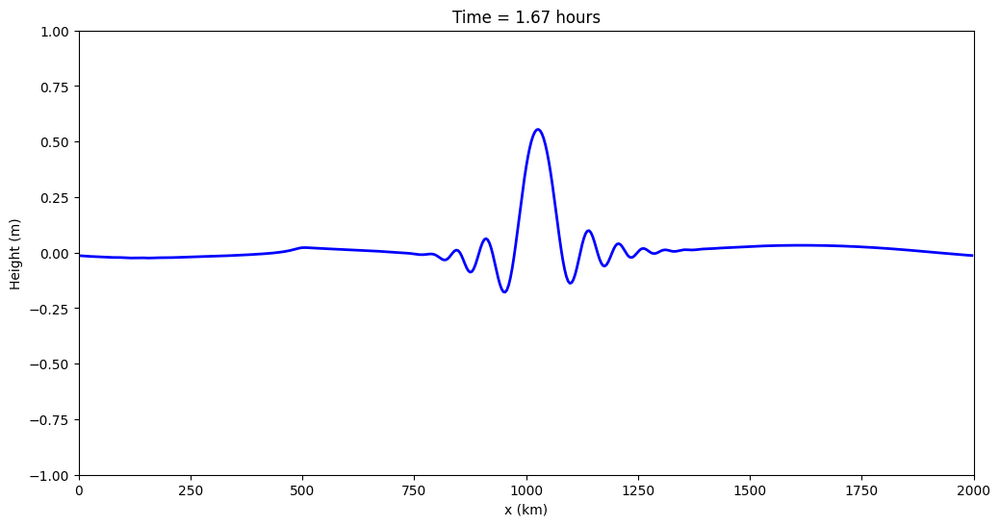

In [ ]:
# create a figure and axes
fig = plt.figure(figsize=(12,6))

# Specify the axis limits and labels
plt.xlim((0, Lx / (1*kilometer)))
plt.ylim((-1, 1))
plt.xlabel('x (km)')
plt.ylabel('Height (m)')

# Create objects that will change during the animation
txt_title = plt.title('')
height, = plt.plot([], [], 'b', lw=2)

# Define an animation function
def drawframe(n):
    height.set_data(x/(1*kilometer), h_save[n,:])
    txt_title.set_text('Time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())


In [ ]:
print(f"The seamount is at x-coordinate {x2/1000}, the top of the seamount is at depth 4km from the surface, and the seamount is 100m tall.")

The seamount is at x-coordinate 500.0, the top of the seamount is at depth 4km from the surface, and the seamount is 100m tall.


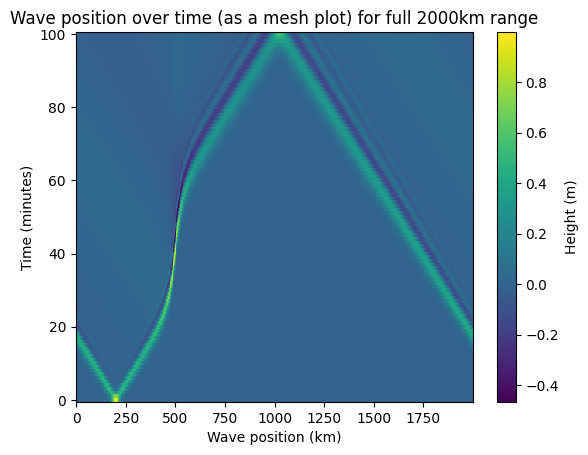

In [ ]:
plt.pcolormesh(x/kilometer, np.array(t_save)/minute, h_save)
plt.title('Wave position over time (as a mesh plot) for full 2000km range')
plt.xlabel('Wave position (km)')
plt.ylabel('Time (minutes)')
plt.colorbar(label='Height (m)')

### 1.3 Student investigation
<a id='section1pt3'></a>
In the cells below, provide an expression for the expected wave speed and state any assumptions that are necessary to arrive at this. Then plot the wave speed from the output above and compare this with the expected value.

**The equations we're solving, from above, are as follows:**
$$ \partial_t u + g \partial_x(h) = - u\partial_x u$$
$$ \partial_t h + \partial_x(Hu) = -\partial_x(hu).$$

**To get these equations we have taken the general rotating shallow water equations with $f=0$, $v=0$ and $\frac{\partial}{\partial y}=0$. This means that the wave travels along the equator with no North/Southward direction. With these assumptions, the expected wave speed is $c=\pm\sqrt{gH_0}$.**

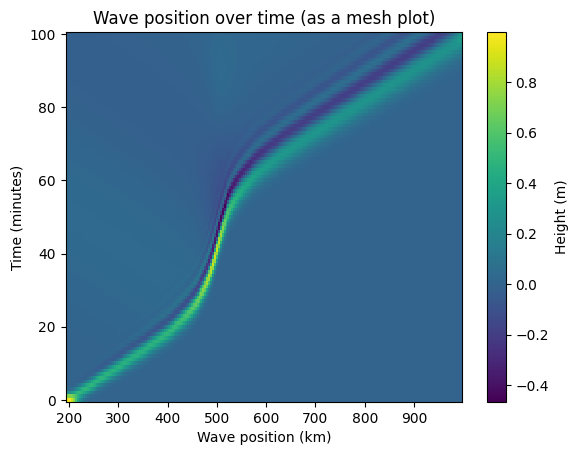

In [ ]:
# to not get intereference of multiple waves in the investigation of the wave speed...
    # we ignore the right hand half of the x-domain
    # and we ignore the bits left of 50m
h_save_left_wave = h_save[:,50:int(len(h_save[0])/2)]

# we can visualise this as follows (and verify that we're only tracking one wave)
x_subset_km = x[50:int(len(h_save[0])/2)] / kilometer
t_save_mins = np.array(t_save)/60
plt.pcolormesh(x_subset_km, t_save_mins, h_save_left_wave, shading='auto')
plt.title('Wave position over time (as a mesh plot)')
plt.xlabel('Wave position (km)')
plt.ylabel('Time (minutes)')
plt.colorbar(label='Height (m)')

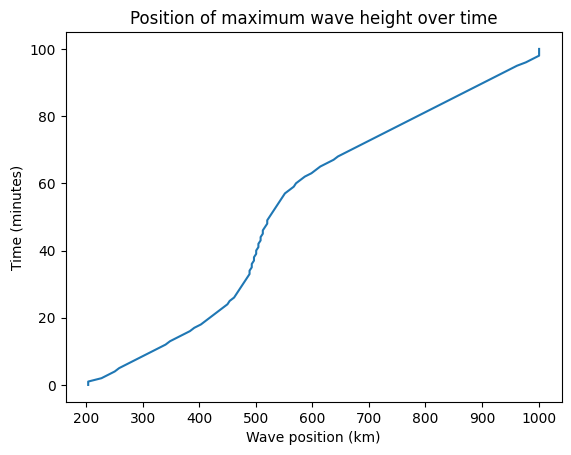

In [ ]:
# then, to work out the wave speed, we must track the point of maximum wave height
h_max_coordinate = x[np.argmax(h_save_left_wave, axis=1)]

# we can visualise this...
plt.plot(200+ h_max_coordinate / kilometer, t_save_mins) # +200km to make x axis be 200-1000km which is where this wave actually occurs
plt.title('Position of maximum wave height over time')
plt.xlabel('Wave position (km)')
plt.ylabel('Time (minutes)')
plt.show()

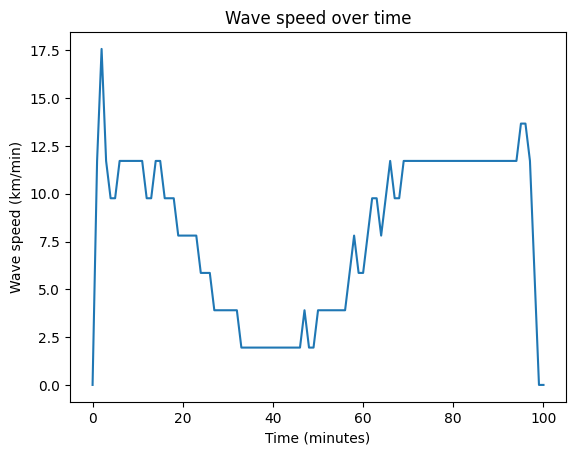

In [ ]:
# now we can use the tracking of the maximum wave height to calculate the wave speed
wave_speed = np.gradient(h_max_coordinate)/ kilometer

# again we can see this visually...
plt.plot(t_save_mins, wave_speed)
plt.title('Wave speed over time')
plt.xlabel('Time (minutes)')
plt.ylabel('Wave speed (km/min)')
plt.show()

In [ ]:
print(f"The mean simulated wave speed is: {np.mean(wave_speed):.2f} km/min")

# Calculate theoretical wave speed c = sqrt(gH0)
c_theoretical_meters_per_second = np.sqrt(g * H0)
c_theoretical_km_per_minute = c_theoretical_meters_per_second * (60 / 1000)

print(f"The theoretical wave speed is: {c_theoretical_km_per_minute:.2f} km/min")

The mean simulated wave speed is: 7.89 km/min
The theoretical wave speed is: 11.89 km/min


**Our results give that the mean wave speed from the simulation is 7.89km/min, while the theoretical wave speed is 11.89km/min. This difference has a couple of possible explanations:**
- **The theoretical wave speed evaluated the linearised shallow water equations while the simuation solved the nonlinear ones, which could've contributed to the discrepancy.**
- **The wave will likely travel slower over the seamount, but the theoretical wave speed is based on the deep ocean depth.**
- **The calculation of the mean simulated wave speed only accounts for the specific wave we focused on, whereas the theoretical wave speed incorporates all waves present in the scenario.**

## 2.  2D Shallow water equations

Now, let's see how things change if we move to two dimensions. The script below solves the 2D shallow water equations:

$$ \partial_t u + g \partial_x(h) = - u*\partial_x u - v*\partial_y u$$
$$ \partial_t u + g \partial_y(h) = - u*\partial_x v - v*\partial_y v$$
$$ \partial_t h + \partial_x(u*H) + \partial_y(v*H) = -\partial_x(h*u) - \partial_y(h*v)$$

We will initilize the Tsunami with the following equation
$$ h=e^{-x^2/w_1^2} $$
$$ u=(g/c)*h $$

where $c=\sqrt{gH_0}$ and $H_0$ is the constant reference depth. The relationship between $u$ and $h$ follows from linearized shallow water equations and corresponds to a wave propagating in the $+x$ direction with a speed $c$.

We will solve the equations in a square domain with periodic boundary conditions and a Gaussian seamount in the middle of the domain with height

$$ H=H_{min}e^{-(x^2+y^2)/w_2^2} $$

The Tsunami should propagate with speed $c$ over the deep ocean where the depth is constant, but the wave will be modified as it passes over the seamount.

### 2.1  Dedalus script to solve the 2D shallow water equations

In [ ]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Specify the simulation parameters
Lx = 1000 * kilometer # The domain size in x
Ly = 1000 * kilometer # The domain size in y
Nx = 64 # The number of gridpoints in x
Ny = 64 # The number of gridpoints in y
g = 9.81 * meter / second**2 # Gravitational acceleration
H0 = 4 * kilometer # Reference ocean depth
c = np.sqrt(g*H0) # Wave speed over the deep ocean
H_min = 1 * kilometer # Minimum depth above the seamount
w1 = 50 * kilometer # Set the width of the wave
w2 = 200 * kilometer # Width of the seamount
x1 = -300 * kilometer # Center of the wave at t=0

timestep = 60 * second # Specify the timestep
stop_sim_time = 60 * minute # Specify the stopping time

timestepper = dedalus.RK222
max_timestep = 0.125

# Bases
coords = dedalus.CartesianCoordinates('x', 'y')
dist = dedalus.Distributor(coords, dtype=np.float64)
xbasis = dedalus.RealFourier(coords['x'], size=Nx, bounds=(-Lx/2, Lx/2), dealias=3/2)
ybasis = dedalus.RealFourier(coords['y'], size=Ny, bounds=(-Ly/2, Ly/2), dealias=3/2)

x, y = dist.local_grids(xbasis, ybasis)

# Fields
u = dist.Field(name='u', bases=(xbasis, ybasis))
v = dist.Field(name='v', bases=(xbasis, ybasis))
h = dist.Field(name='h', bases=(xbasis, ybasis))
H = dist.Field(name='H', bases=(xbasis, ybasis))

# Initial conditions
H.change_scales(1)
h.change_scales(1) # Set values on regular grid
u.change_scales(1)
v.change_scales(1)
H['g'] = H0-(H0-H_min)*np.exp(-x**2.0/w2**2.0 - y**2.0/w2**2.0)
h['g'] = np.exp(-(x-x1)**2/w1**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
u['g'] = (g/c)*h['g']
v['g'] = 0

# Operators
dx = lambda a: dedalus.Differentiate(a, coords['x'])
dy = lambda a: dedalus.Differentiate(a, coords['y'])

# Problem
problem = dedalus.IVP([u, v, h], namespace=locals())
problem.add_equation("dt(u) + g*dx(h) = - u*dx(u) - v*dy(u)")
problem.add_equation("dt(v) + g*dy(h) = - u*dx(v) - v*dy(v)")
problem.add_equation("dt(h) + (dx(H*u) + dy(H*v)) = - dx(h*u) - dy(h*v)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

# Analysis
snapshots = solver.evaluator.add_file_handler('snapshots', sim_dt=1*hour, max_writes=10)
snapshots.add_task(h, name='h')
snapshots.add_task(u, name='u')
snapshots.add_task(v, name='v')

h.change_scales(1)
h_save = [np.copy(h['g'])]; t_save = [solver.sim_time]; # Save the initial condition and the initial time
# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0:
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save=np.array(h_save) # convert h_save to an np.array type to allow data slicing

INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 22s, Remaining: 0s, Rate: 4.6e-02/s


2025-11-17 16:57:32,059 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 22s, Remaining: 0s, Rate: 4.6e-02/s


INFO:__main__:Starting main loop


2025-11-17 16:57:32,066 __main__ 0/1 INFO :: Starting main loop


INFO:solvers:Simulation stop time reached.


2025-11-17 16:57:40,702 solvers 0/1 INFO :: Simulation stop time reached.


INFO:solvers:Final iteration: 60


2025-11-17 16:57:40,703 solvers 0/1 INFO :: Final iteration: 60


INFO:solvers:Final sim time: 3600.0


2025-11-17 16:57:40,706 solvers 0/1 INFO :: Final sim time: 3600.0


INFO:solvers:Setup time (init - iter 0): 21.77 sec


2025-11-17 16:57:40,707 solvers 0/1 INFO :: Setup time (init - iter 0): 21.77 sec


INFO:solvers:Warmup time (iter 0-10): 4.645 sec


2025-11-17 16:57:40,709 solvers 0/1 INFO :: Warmup time (iter 0-10): 4.645 sec


INFO:solvers:Run time (iter 10-end): 3.99 sec


2025-11-17 16:57:40,710 solvers 0/1 INFO :: Run time (iter 10-end): 3.99 sec


INFO:solvers:CPU time (iter 10-end): 0.001108 cpu-hr


2025-11-17 16:57:40,712 solvers 0/1 INFO :: CPU time (iter 10-end): 0.001108 cpu-hr


INFO:solvers:Speed: 2.984e+05 mode-stages/cpu-sec


2025-11-17 16:57:40,713 solvers 0/1 INFO :: Speed: 2.984e+05 mode-stages/cpu-sec


### 2.2  Plotting
The code below will make a movie of the height as a function of x and y

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


2025-11-17 17:19:32,433 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpk3h4wpqw/temp.m4v


2025-11-17 17:19:32,436 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpk3h4wpqw/temp.m4v


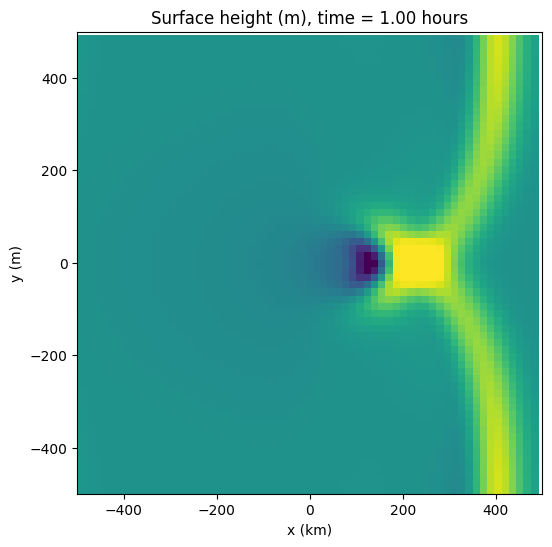

In [ ]:
# create a figure and axes
fig = plt.figure(figsize=(6,6))

# Create arrays with the x and y coordinates for plotting using pcolor
from dedalus.extras import plot_tools
(X, Y) = plot_tools.quad_mesh(np.squeeze(x), np.squeeze(y))

# Define an animation function
def drawframe(n):
    plt.clf
    height = plt.pcolor(X/(1*kilometer), Y/(1*kilometer), h_save[n,:,:].T, vmin=-1, vmax=1)
    # Specify the axis limits and labels
    plt.xlim((-Lx/2 / (1*kilometer),Lx/2 / (1*kilometer)))
    plt.ylim((-Ly/2 / (1*kilometer),Ly/2 / (1*kilometer)))
    plt.xlabel('x (km)')
    plt.ylabel('y (m)')
    plt.title('Surface height (m), time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

### 2.3 Student investigation
<a id='section2pt3'></a>
Qualitatively describe the influence of the seamount and explain this behavior using the shallow water equations. You can assume that the wave amplitude and velocity are small in the shallow water equations.

**We can see in the animation that there is refraction of the wave at about $x\simeq-150km$, which is $\sim150km$ west of the centre of seamount. This then continues for the rest of time throughout the domain as the water particles nearer to $y=0$ move much slower than those further away from the seamount. It is only really particles within the range $-200\le y\le 200m$ that are affected. After 1 hour (and when the whole refracted wave has passed the seamount) we can see that the regions at $y=\pm 400m$ are nearly 200m further ahead than the part of the wave at $y=0m$. It is also worth noting that the wave is symmetrical about $y=0$, i.e. there is no effect of the coriolis force in this model.**

**Let us now look at the 2D shallow water equations, which we recall to be:**
$$ \partial_t u + g \partial_x(h) = - u\partial_x u - v\partial_y u$$
$$ \partial_t u + g \partial_y(h) = - u\partial_x v - v\partial_y v$$
$$ \partial_t h + \partial_x(uH) + \partial_y(vH) = -\partial_x(hu) - \partial_y(hv).$$

**TALK ABOUT THE ANIMATION AND THESE EQUATIONS!!!!!!!!!!!!!**



Try varying some parameters (e.g. the width and height of the wave and/or seamount) and comment on the results. When does the wave no longer obey the linear shallow water equations which are valid for small waves. You don't need to do a comprehensive parameter space search, but you should run several simulations with one or two parameters varied.

In [ ]:
def simulation_changing_w2(w2_val):
    logger = logging.getLogger(__name__)

    # units
    meter = 1
    kilometer = meter * 1e3
    second = 1
    minute = 60
    hour = 3600
    day = hour * 24

    # simulation parameters
    Lx = 1000 * kilometer # The domain size in x
    Ly = 1000 * kilometer # The domain size in y
    Nx = 64 # The number of gridpoints in x
    Ny = 64 # The number of gridpoints in y
    g = 9.81 * meter / second**2 # Gravitational acceleration
    H0 = 4 * kilometer # Reference ocean depth
    c = np.sqrt(g*H0) # Wave speed over the deep ocean
    H_min = 1 * kilometer # Minimum depth above the seamount
    w1 = 50 * kilometer # Set the width of the wave
    # w2 is an argument (w2_val)
    x1 = -300 * kilometer # Center of the wave at t=0

    timestep = 60 * second # Specify the timestep
    stop_sim_time = 60 * minute # Specify the stopping time

    # Bases
    coords = dedalus.CartesianCoordinates('x', 'y')
    dist = dedalus.Distributor(coords, dtype=np.float64)
    xbasis = dedalus.RealFourier(coords['x'], size=Nx, bounds=(-Lx/2, Lx/2), dealias=3/2)
    ybasis = dedalus.RealFourier(coords['y'], size=Ny, bounds=(-Ly/2, Ly/2), dealias=3/2)

    x, y = dist.local_grids(xbasis, ybasis)

    # Fields
    u = dist.Field(name='u', bases=(xbasis, ybasis))
    v = dist.Field(name='v', bases=(xbasis, ybasis))
    h = dist.Field(name='h', bases=(xbasis, ybasis))
    H = dist.Field(name='H', bases=(xbasis, ybasis))

    # Initial conditions
    H.change_scales(1)
    h.change_scales(1) # Set values on regular grid
    u.change_scales(1)
    v.change_scales(1)
    # Use the provided w2_val for the seamount width
    H['g'] = H0-(H0-H_min)*np.exp(-x**2.0/w2_val**2.0 - y**2.0/w2_val**2.0)
    h['g'] = np.exp(-(x-x1)**2/w1**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
    u['g'] = (g/c)*h['g']
    v['g'] = 0

    # Operators
    dx = lambda a: dedalus.Differentiate(a, coords['x'])
    dy = lambda a: dedalus.Differentiate(a, coords['y'])

    # Problem
    problem = dedalus.IVP([u, v, h], namespace=locals())
    problem.add_equation("dt(u) + g*dx(h) = - u*dx(u) - v*dy(u)")
    problem.add_equation("dt(v) + g*dy(h) = - u*dx(v) - v*dy(v)")
    problem.add_equation("dt(h) + (dx(H*u) + dy(H*v)) = - dx(h*u) - dy(h*v)")

    # Solver
    solver = problem.build_solver(dedalus.RK222)
    solver.stop_sim_time = stop_sim_time

    h_save_local = []
    t_save_local = []

    h.change_scales(1)
    h_save_local.append(np.copy(h['g']))
    t_save_local.append(solver.sim_time)

    # Main loop
    try:
        logger.info(f'Starting main loop for w2 = {w2_val / kilometer} km')
        while solver.proceed:
            solver.step(timestep)
            if (solver.iteration-1) % 1 == 0:
                h.change_scales(1)
                h_save_local.append(np.copy(h['g']))
                t_save_local.append(solver.sim_time)
    except Exception as e:
        logger.error(f'Exception raised for w2 = {w2_val / kilometer} km: {e}')
        raise

    return np.array(h_save_local), np.array(t_save_local), x, y

def simulation_changing_H_min(H_min_val):
    logger = logging.getLogger(__name__)

    # units...
    meter = 1
    kilometer = meter * 1e3
    second = 1
    minute = 60
    hour = 3600
    day = hour * 24

    # simulation parameters
    Lx = 1000 * kilometer # The domain size in x
    Ly = 1000 * kilometer # The domain size in y
    Nx = 64 # The number of gridpoints in x
    Ny = 64 # The number of gridpoints in y
    g = 9.81 * meter / second**2 # Gravitational acceleration
    H0 = 4 * kilometer # Reference ocean depth
    c = np.sqrt(g*H0) # Wave speed over the deep ocean
    # H_min is an argument (H_min_val)
    w1 = 50 * kilometer # Set the width of the wave
    w2 = 200 * kilometer # Width of the seamount
    x1 = -300 * kilometer # Center of the wave at t=0

    timestep = 60 * second # Specify the timestep
    stop_sim_time = 60 * minute # Specify the stopping time

    # Bases
    coords = dedalus.CartesianCoordinates('x', 'y')
    dist = dedalus.Distributor(coords, dtype=np.float64)
    xbasis = dedalus.RealFourier(coords['x'], size=Nx, bounds=(-Lx/2, Lx/2), dealias=3/2)
    ybasis = dedalus.RealFourier(coords['y'], size=Ny, bounds=(-Ly/2, Ly/2), dealias=3/2)

    x, y = dist.local_grids(xbasis, ybasis)

    # Fields
    u = dist.Field(name='u', bases=(xbasis, ybasis))
    v = dist.Field(name='v', bases=(xbasis, ybasis))
    h = dist.Field(name='h', bases=(xbasis, ybasis))
    H = dist.Field(name='H', bases=(xbasis, ybasis))

    # Initial conditions
    H.change_scales(1)
    h.change_scales(1) # Set values on regular grid
    u.change_scales(1)
    v.change_scales(1)
    # Use the provided H_min_val for the seamount width
    H['g'] = H0-(H0-H_min_val)*np.exp(-x**2.0/w2**2.0 - y**2.0/w2**2.0)
    h['g'] = np.exp(-(x-x1)**2/w1**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
    u['g'] = (g/c)*h['g']
    v['g'] = 0

    # Operators
    dx = lambda a: dedalus.Differentiate(a, coords['x'])
    dy = lambda a: dedalus.Differentiate(a, coords['y'])

    # Problem
    problem = dedalus.IVP([u, v, h], namespace=locals())
    problem.add_equation("dt(u) + g*dx(h) = - u*dx(u) - v*dy(u)")
    problem.add_equation("dt(v) + g*dy(h) = - u*dx(v) - v*dy(v)")
    problem.add_equation("dt(h) + (dx(H*u) + dy(H*v)) = - dx(h*u) - dy(h*v)")

    # Solver
    solver = problem.build_solver(dedalus.RK222)
    solver.stop_sim_time = stop_sim_time

    h_save_local = []
    t_save_local = []

    h.change_scales(1)
    h_save_local.append(np.copy(h['g']))
    t_save_local.append(solver.sim_time)

    # Main loop
    try:
        logger.info(f'Starting main loop for H_min = {H_min_val / kilometer} km')
        while solver.proceed:
            solver.step(timestep)
            if (solver.iteration-1) % 1 == 0:
                h.change_scales(1)
                h_save_local.append(np.copy(h['g']))
                t_save_local.append(solver.sim_time)
    except Exception as e:
        logger.error(f'Exception raised for H_min = {H_min_val / kilometer} km: {e}')
        raise

    return np.array(h_save_local), np.array(t_save_local), x, y

In [ ]:
# Define different w2 values to test
w2_values = [50 * kilometer, 100 * kilometer, 200 * kilometer, 300 * kilometer]
all_results_w2 = []

for w2_val in w2_values:
    h_save_data, t_save_data, x_data, y_data = simulation_changing_w2(w2_val)
    all_results_w2.append((h_save_data, t_save_data, x_data, y_data))

# Define different H_min values to test
H_min_values = [0.1 * kilometer, 1 * kilometer, 2 * kilometer, 3 * kilometer]
all_results_H_min = []

for H_min_val in H_min_values:
    h_save_data, t_save_data, x_data, y_data = simulation_changing_H_min(H_min_val)
    all_results_H_min.append((h_save_data, t_save_data, x_data, y_data))

INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 13s, Remaining: 0s, Rate: 7.6e-02/s


2025-11-17 19:18:13,698 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 13s, Remaining: 0s, Rate: 7.6e-02/s


INFO:__main__:Starting main loop for w2 = 50.0 km


2025-11-17 19:18:13,702 __main__ 0/1 INFO :: Starting main loop for w2 = 50.0 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:18:22,084 solvers 0/1 INFO :: Simulation stop time reached.


INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 3s, Remaining: 0s, Rate: 3.6e-01/s


2025-11-17 19:18:24,875 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 3s, Remaining: 0s, Rate: 3.6e-01/s


INFO:__main__:Starting main loop for w2 = 100.0 km


2025-11-17 19:18:24,877 __main__ 0/1 INFO :: Starting main loop for w2 = 100.0 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:18:40,120 solvers 0/1 INFO :: Simulation stop time reached.


INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 17s, Remaining: 0s, Rate: 6.0e-02/s


2025-11-17 19:18:56,933 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 17s, Remaining: 0s, Rate: 6.0e-02/s


INFO:__main__:Starting main loop for w2 = 200.0 km


2025-11-17 19:18:56,938 __main__ 0/1 INFO :: Starting main loop for w2 = 200.0 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:19:05,264 solvers 0/1 INFO :: Simulation stop time reached.


INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 25s, Remaining: 0s, Rate: 4.0e-02/s


2025-11-17 19:19:30,543 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 25s, Remaining: 0s, Rate: 4.0e-02/s


INFO:__main__:Starting main loop for w2 = 300.0 km


2025-11-17 19:19:30,547 __main__ 0/1 INFO :: Starting main loop for w2 = 300.0 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:19:38,572 solvers 0/1 INFO :: Simulation stop time reached.


INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 20s, Remaining: 0s, Rate: 5.1e-02/s


2025-11-17 19:19:58,385 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 20s, Remaining: 0s, Rate: 5.1e-02/s


INFO:__main__:Starting main loop for H_min = 0.1 km


2025-11-17 19:19:58,389 __main__ 0/1 INFO :: Starting main loop for H_min = 0.1 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:20:06,930 solvers 0/1 INFO :: Simulation stop time reached.


INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 17s, Remaining: 0s, Rate: 5.9e-02/s


2025-11-17 19:20:23,884 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 17s, Remaining: 0s, Rate: 5.9e-02/s


INFO:__main__:Starting main loop for H_min = 1.0 km


2025-11-17 19:20:23,887 __main__ 0/1 INFO :: Starting main loop for H_min = 1.0 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:20:32,341 solvers 0/1 INFO :: Simulation stop time reached.


INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 14s, Remaining: 0s, Rate: 7.2e-02/s


2025-11-17 19:20:46,257 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 14s, Remaining: 0s, Rate: 7.2e-02/s


INFO:__main__:Starting main loop for H_min = 2.0 km


2025-11-17 19:20:46,260 __main__ 0/1 INFO :: Starting main loop for H_min = 2.0 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:20:53,787 solvers 0/1 INFO :: Simulation stop time reached.


INFO:subsystems:Building subproblem matrices 1/1 (~100%) Elapsed: 10s, Remaining: 0s, Rate: 1.0e-01/s


2025-11-17 19:21:03,576 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 10s, Remaining: 0s, Rate: 1.0e-01/s


INFO:__main__:Starting main loop for H_min = 3.0 km


2025-11-17 19:21:03,580 __main__ 0/1 INFO :: Starting main loop for H_min = 3.0 km


INFO:solvers:Simulation stop time reached.


2025-11-17 19:21:11,132 solvers 0/1 INFO :: Simulation stop time reached.


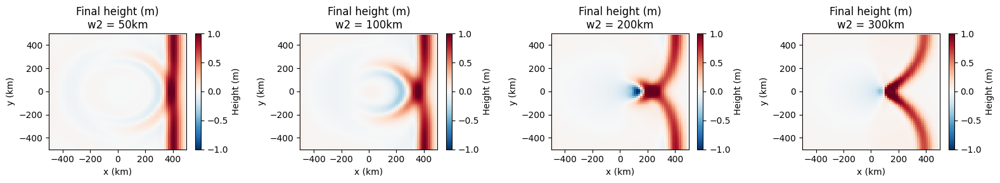

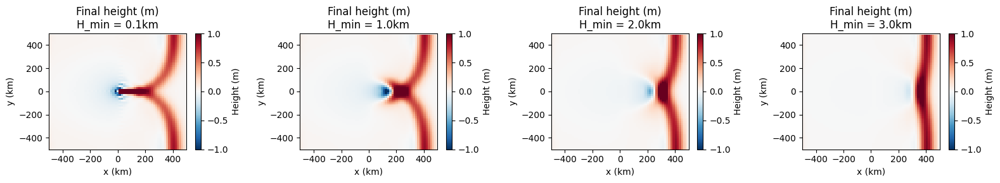

In [ ]:
from dedalus.extras import plot_tools

fig, axes = plt.subplots(1, len(w2_values), figsize=(4 * len(w2_values), 3), squeeze=False)
axes = axes.flatten()

for i, (w2_val, (h_save_data, t_save_data, x_data, y_data)) in enumerate(zip(w2_values, all_results_w2)):
    ax = axes[i]
    # Plot the final time step of the height field
    h_final = h_save_data[-1, :, :]
    (X, Y) = plot_tools.quad_mesh(np.squeeze(x_data), np.squeeze(y_data))
    im = ax.pcolormesh(X/(1*kilometer), Y/(1*kilometer), h_final.T, vmin=-1, vmax=1, cmap='RdBu_r')
    ax.set_xlim((-Lx/2 / (1*kilometer), Lx/2 / (1*kilometer)))
    ax.set_ylim((-Ly/2 / (1*kilometer), Ly/2 / (1*kilometer)))
    ax.set_xlabel('x (km)')
    ax.set_ylabel('y (km)')
    ax.set_title(f'Final height (m)\nw2 = {w2_val/kilometer:.0f}km')
    fig.colorbar(im, ax=ax, label='Height (m)')

plt.tight_layout()
plt.show()

# now for H_min...
fig, axes = plt.subplots(1, len(H_min_values), figsize=(4 * len(H_min_values), 3), squeeze=False)
axes = axes.flatten()

for i, (H_min_val, (h_save_data, t_save_data, x_data, y_data)) in enumerate(zip(H_min_values, all_results_H_min)):
    ax = axes[i]
    # Plot the final time step of the height field
    h_final = h_save_data[-1, :, :]
    (X, Y) = plot_tools.quad_mesh(np.squeeze(x_data), np.squeeze(y_data))
    im = ax.pcolormesh(X/(1*kilometer), Y/(1*kilometer), h_final.T, vmin=-1, vmax=1, cmap='RdBu_r')
    ax.set_xlim((-Lx/2 / (1*kilometer), Lx/2 / (1*kilometer)))
    ax.set_ylim((-Ly/2 / (1*kilometer), Ly/2 / (1*kilometer)))
    ax.set_xlabel('x (km)')
    ax.set_ylabel('y (km)')
    ax.set_title(f'Final height (m)\nH_min = {H_min_val/kilometer:.1f}km')
    fig.colorbar(im, ax=ax, label='Height (m)')

plt.tight_layout()
plt.show()

**The top three plots show the simulation after 1hr for  different values of the width of the seamount, namely $w2=50, 100, 200, 300km$. We can see that for a wider seamount the wave refraction occurs over a larger range of y values, and for narrower seasmounts we see more focused refraction. For example, when $w2=100km$ only the parts of the wave between $-100\le y\le 100km$ are affected but for $w2=300km$ the wave is affected between $-400\le y\le 400km$. Another noticeable change is the distance in the x-direction between the wave at $y=\pm 400m$ and the highest point of the wave along the $y=0$ axis. We can see that this distance is much larger for waves passing over a wider seamount compared to waves passing over a narrower seamount. The final thing to note is that the narrowest and widest seamounts visualised here don't show much of a decrease in height, whereas the middle case ($w2=200km$) shows a much larger decrease in height at the furthest back part of the wave.**

**The bottom three plots show the simulation after 1hr for different values of the minimum depth above the seamount, namely $H\_min=0.1,1,2,3km$. We can clearly see that for seamounts nearer to the surface, there is much greater wave refraction than for seamounts that are deeper. For example, there is barely any refraction for $H\_min=3km$. This aligns with what one would likely expect, as a deeper seamount has less effect on the waves our simulation is showing since it's further away from them. We can see that for $H\_min=0.1km$ some ripples formed, which could indicate that the wave no longer obeys the linear shallow water equations.**

## 3. Shallow water equations on a sphere

Of course the Earth isn't a flat plane. A great strength of Dedalus is its flexibility to solve equations in various geometries. The script below solves the 2D shallow water equations on a spherical shell, where the azimuth and colatitude are the independent variables. The colatitude is the complementary angle to the latitude such that the colatitude is $0^\circ$ at the North Pole, $90^\circ$ at the Equator, and $180^\circ$ at the South Pole. The spherical geometry also allows us to take into account the Earth's rotation in a realistic way. In this part of the project, we will assume that the bottom of the ocean is flat and that the resting height of the ocean is a constant $H$.  

We will use Dedalus to solve the following equations:
$$ \partial_t \mathbf{u} + g \nabla h + 2 \Omega \hat{\mathbf{z}} \times \mathbf{u} = -\mathbf{u} \cdot \nabla \mathbf{u} $$
$$ \partial_t + H \nabla \cdot \mathbf{u} = -\nabla \cdot (h \mathbf{u}) $$

where $\mathbf{u}$ is the velocity vector, $\Omega$ is the Earth's angular velocity (in radians per second), and $\hat{\mathbf{z}}$ is a unit vector aligned with the North Pole. Note that we have written the equations above in vector form. Dedalus includes vector calculus operators that make it very natural to solve equations like this without worrying about the particular form of the vector operators in a curvilinear coordinate system.

### 3.1  Dedalus script for 2D shallow water equations on a sphere

In [7]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Parameters
Nphi = 128 # Number of gridpoints in phi (longitude)
Ntheta = 64 # Number of gridpoints in theta (colatitude)
R = 6.37122e3 * kilometer
Omega = 2 * np.pi / (1 * day) # Earth's angular velocity in radians per second
g = 9.80616 * meter / second**2 # Gravitational acceleration
H = 4 * kilometer # Depth of the ocean
width = 2*np.pi*10/360 # Width of the initial Gaussian in radians
phi0 = np.pi # Longitude of the initial Gaussian height perturbation in radians
theta0 = np.pi/4 # Colatitude of the initial Gaussian height perturbation in radians

timestep = 600 * second
stop_sim_time = 10 * day

# Bases
coords = dedalus.S2Coordinates('phi', 'theta')
dist = dedalus.Distributor(coords, dtype=np.float64)
basis = dedalus.SphereBasis(coords, (Nphi, Ntheta), radius=R, dealias=3/2, dtype=np.float64)

# Define the coordinates
phi, theta = dist.local_grids(basis) # Longitude and colatitude
lat = 360*(np.pi / 2 - theta)/(2*np.pi)  # latitude in degrees

# Fields
u = dist.VectorField(coords, name='u', bases=basis)
h = dist.Field(name='h', bases=basis)

# Operators
# First, create an operator to perform the cross product: "z x ", where z is the local vertical unit vector
# The "skew" operator performs a 90 degree rotation of a vector field,
# so that skew([u,v]) = [-v, u].  MulCosine multiplies by the cosine of the latitude
zcross = lambda A: dedalus.MulCosine(dedalus.skew(A))

# Set the initial conditions
h.change_scales(1) # Set values on regular grid
u.change_scales(1)
h['g'] = np.exp(-((phi-phi0)**2+(theta-theta0)**2)/width**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
# Set the initial velocity to zero
u['g'][0] = 0 # the x-component of the velocity
u['g'][1] = 0 # the y-component of the velocity

# Problem
problem = dedalus.IVP([u, h], namespace=locals())
problem.add_equation("dt(u) + g*grad(h) + 2*Omega*zcross(u) = - u@grad(u)")
problem.add_equation("dt(h) + H*div(u) = - div(h*u)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

h.change_scales(1)
h_save = [np.copy(h['g'])] # Save the initial condition
t_save = [solver.sim_time] # Save the initial time
h_sample = [np.copy(h['g'][96,48])]
t_sample = [solver.sim_time]
      #h = array with phi (longitude) in x position and theta (latitude) in y position

# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0: # changed from 10 to 1 to save the height more often
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
        if (solver.iteration-1) % 5 == 0:
            h.change_scales(1)
            h_sample.append(np.copy(h['g'][96,48]))
            t_sample.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save = np.array(h_save)
h_sample = np.array(h_sample)

INFO:subsystems:Building subproblem matrices 1/63 (~2%) Elapsed: 0s, Remaining: 1s, Rate: 5.2e+01/s


2025-11-18 12:12:13,344 subsystems 0/1 INFO :: Building subproblem matrices 1/63 (~2%) Elapsed: 0s, Remaining: 1s, Rate: 5.2e+01/s


INFO:subsystems:Building subproblem matrices 7/63 (~11%) Elapsed: 0s, Remaining: 1s, Rate: 7.1e+01/s


2025-11-18 12:12:13,424 subsystems 0/1 INFO :: Building subproblem matrices 7/63 (~11%) Elapsed: 0s, Remaining: 1s, Rate: 7.1e+01/s


INFO:subsystems:Building subproblem matrices 14/63 (~22%) Elapsed: 0s, Remaining: 1s, Rate: 7.2e+01/s


2025-11-18 12:12:13,518 subsystems 0/1 INFO :: Building subproblem matrices 14/63 (~22%) Elapsed: 0s, Remaining: 1s, Rate: 7.2e+01/s


INFO:subsystems:Building subproblem matrices 21/63 (~33%) Elapsed: 0s, Remaining: 1s, Rate: 6.8e+01/s


2025-11-18 12:12:13,634 subsystems 0/1 INFO :: Building subproblem matrices 21/63 (~33%) Elapsed: 0s, Remaining: 1s, Rate: 6.8e+01/s


INFO:subsystems:Building subproblem matrices 28/63 (~44%) Elapsed: 0s, Remaining: 1s, Rate: 7.0e+01/s


2025-11-18 12:12:13,725 subsystems 0/1 INFO :: Building subproblem matrices 28/63 (~44%) Elapsed: 0s, Remaining: 1s, Rate: 7.0e+01/s


INFO:subsystems:Building subproblem matrices 35/63 (~56%) Elapsed: 0s, Remaining: 0s, Rate: 7.1e+01/s


2025-11-18 12:12:13,817 subsystems 0/1 INFO :: Building subproblem matrices 35/63 (~56%) Elapsed: 0s, Remaining: 0s, Rate: 7.1e+01/s


INFO:subsystems:Building subproblem matrices 42/63 (~67%) Elapsed: 1s, Remaining: 0s, Rate: 7.2e+01/s


2025-11-18 12:12:13,906 subsystems 0/1 INFO :: Building subproblem matrices 42/63 (~67%) Elapsed: 1s, Remaining: 0s, Rate: 7.2e+01/s


INFO:subsystems:Building subproblem matrices 49/63 (~78%) Elapsed: 1s, Remaining: 0s, Rate: 7.3e+01/s


2025-11-18 12:12:13,992 subsystems 0/1 INFO :: Building subproblem matrices 49/63 (~78%) Elapsed: 1s, Remaining: 0s, Rate: 7.3e+01/s


INFO:subsystems:Building subproblem matrices 56/63 (~89%) Elapsed: 1s, Remaining: 0s, Rate: 7.4e+01/s


2025-11-18 12:12:14,080 subsystems 0/1 INFO :: Building subproblem matrices 56/63 (~89%) Elapsed: 1s, Remaining: 0s, Rate: 7.4e+01/s


INFO:subsystems:Building subproblem matrices 63/63 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 7.5e+01/s


2025-11-18 12:12:14,167 subsystems 0/1 INFO :: Building subproblem matrices 63/63 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 7.5e+01/s


INFO:__main__:Starting main loop


2025-11-18 12:12:14,175 __main__ 0/1 INFO :: Starting main loop


INFO:solvers:Simulation stop time reached.


2025-11-18 12:13:34,247 solvers 0/1 INFO :: Simulation stop time reached.


INFO:solvers:Final iteration: 1440


2025-11-18 12:13:34,249 solvers 0/1 INFO :: Final iteration: 1440


INFO:solvers:Final sim time: 864000.0


2025-11-18 12:13:34,252 solvers 0/1 INFO :: Final sim time: 864000.0


INFO:solvers:Setup time (init - iter 0): 0.8996 sec


2025-11-18 12:13:34,254 solvers 0/1 INFO :: Setup time (init - iter 0): 0.8996 sec


INFO:solvers:Warmup time (iter 0-10): 3.998 sec


2025-11-18 12:13:34,255 solvers 0/1 INFO :: Warmup time (iter 0-10): 3.998 sec


INFO:solvers:Run time (iter 10-end): 76.07 sec


2025-11-18 12:13:34,257 solvers 0/1 INFO :: Run time (iter 10-end): 76.07 sec


INFO:solvers:CPU time (iter 10-end): 0.02113 cpu-hr


2025-11-18 12:13:34,260 solvers 0/1 INFO :: CPU time (iter 10-end): 0.02113 cpu-hr


INFO:solvers:Speed: 4.546e+05 mode-stages/cpu-sec


2025-11-18 12:13:34,261 solvers 0/1 INFO :: Speed: 4.546e+05 mode-stages/cpu-sec


### 3.2  Plotting
The code below will make a movie of the height as a function of x and y

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


2025-11-18 12:14:41,093 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpf9x7cqwe/temp.m4v


2025-11-18 12:14:41,096 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmpf9x7cqwe/temp.m4v


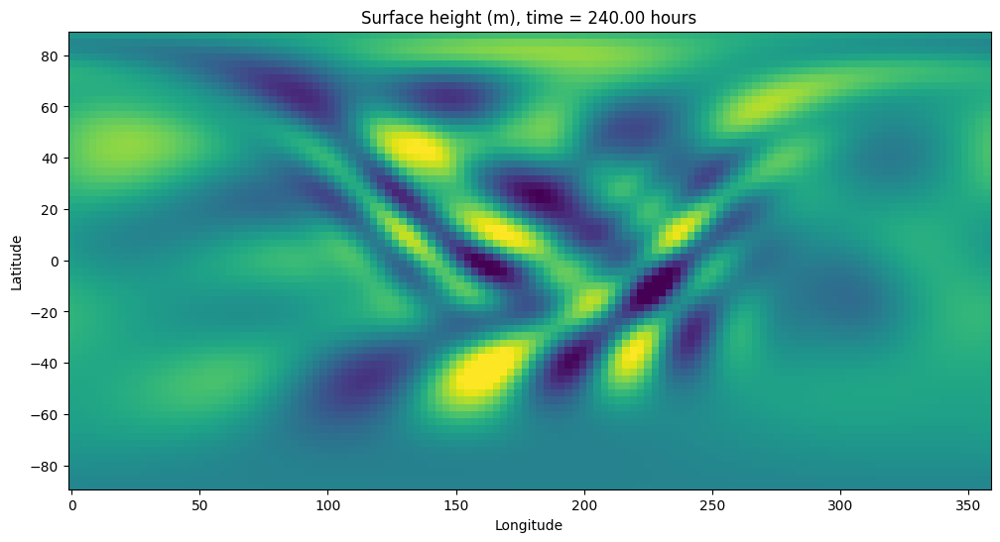

In [8]:
# create a figure and axes
fig = plt.figure(figsize=(12,6))

# Create arrays with the latitude and longitude coordinates for plotting using pcolor
from dedalus.extras import plot_tools
(X, Y) = plot_tools.quad_mesh(np.squeeze(np.pi/2 - theta)*360/2/np.pi, np.squeeze(phi)*360/2/np.pi)

# Define an animation function
def drawframe(n):
    plt.clf()
    height = plt.pcolor(Y, X, h_save[n,:,:], vmin=-0.1, vmax=0.1)
    # Specify the axis limits and labels
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Surface height (m), time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

### 3.3 Student investigation
<a id='section3pt3'></a>
Create a virtual tide gauge by sampling the height at a point at a latitude of 45ºN and longitude of 90ºW and plot the timeseries of the height at this point in the cells below. You should modifty the code to save the height more often so that you can clearly see the shape of the wave. Notice that as the waves propagate around the Earth, their shape changes. Discuss physical mechanisms that might cause the shape of the wave to change as the wave propagates.

**We need to look at the height at a point with...**
- **Longitude 90ºW = 270ºE which means we need the $(270/360)\times 128 = 96th$ grid point**
- **Latitude 45ºN which means we need the $(3/4)\times 64 = 48th$ grid point**

**I edited the above code (in 3.1) to add in h_sample and t_sample which focus only on a point at a latitude of 45ºN and longitude of 90ºW. I also edited the code to save the height more often, which should allow us to more clearly see the waves shape. The plot below shows the output...**

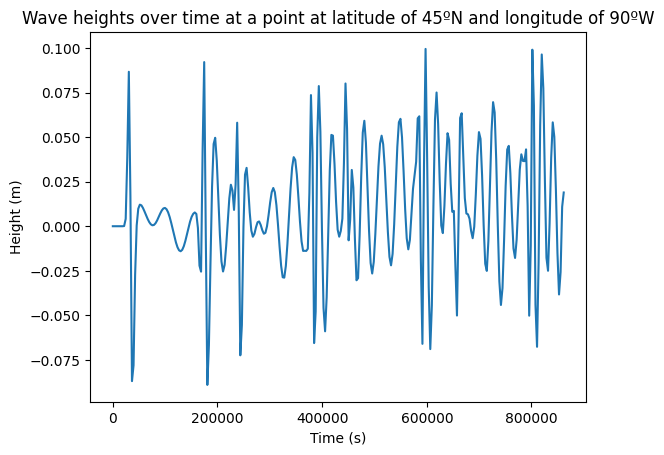

In [9]:
plt.plot(t_sample, h_sample)
plt.title('Wave heights over time at a point at latitude of 45ºN and longitude of 90ºW')
plt.xlabel('Time (s)')
plt.ylabel('Height (m)')
plt.show()

**Some physical mechanisms that might cause the shape of the wave to change as the wave propagates are as follows:**
- **The earth's rotation could affect how the wave propoagates through the Coriolis effect, which is likely to change the waves direction.**
- **As the wave travels around the earth, it's likely to spread out radially. This means the energy is more spread out but, since energy is conserved, the amplitude must then decrease with distance travelled.**
- **Friction of the tsunami with the seabed (although small due to the large ocean depth) might affect the way the wave travels, as it could mean that the surafce might travel faster than the deeper waves.**
- **As observed in an LNM laboratory experiment, the crest will likely move faster than the trough. This can lead to a steeper wave front and a more shallow slope of the back of the wave.**

In the simulation above, the Tsunami wave travels around the planet many times. In reality, the waves will partially dissipate when they reach shorelines. In the spherical shallow water equation code above (or in a new code block below), add a forcing term to the shallow water equations that damps the waves for longitudes larger than $\pm 90^\circ$. Specifically, add a forcing function to the right hand side of the height equation of the following form:

$$ - (1/\tau) f(\phi) h$$

where

$$ f(\phi) = \frac{1}{2}\left(1+tanh\left(\frac{\phi-3\pi/2}{\pi/10}\right)\right) + \frac{1}{2}\left(1-tanh\left(\frac{\phi-\pi/2}{\pi/10}\right)\right) $$

and $\phi$ is the co-latitude in radians and $\tau$ is a damping timescale. A timescale of $\tau=0.1$ days should be sufficient to damp the waves.

With this damping term active, much more slowly propagating waves should be visible. These are shallow water Rossby waves. Estimate the east/west phase speed of these Rossby waves from the theoretical dispersion relation and compare this estimate with the phase speed that you can infer from the simulation by plotting the height, $h$, as a function of longitude and time. Discuss the spatial structure of the Rossby waves and any discrepancies that you see between your estimated and measured phase speeds.

In [23]:
from math import tanh
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Parameters
Nphi = 128 # Number of gridpoints in phi (longitude)
Ntheta = 64 # Number of gridpoints in theta (colatitude)
R = 6.37122e3 * kilometer
Omega = 2 * np.pi / (1 * day) # Earth's angular velocity in radians per second
g = 9.80616 * meter / second**2 # Gravitational acceleration
H = 4 * kilometer # Depth of the ocean
width = 2*np.pi*10/360 # Width of the initial Gaussian in radians
phi0 = np.pi # Longitude of the initial Gaussian height perturbation in radians
theta0 = np.pi/4 # Colatitude of the initial Gaussian height perturbation in radians
tau = 0.1 * day

timestep = 600 * second
stop_sim_time = 10 * day

# Bases
coords = dedalus.S2Coordinates('phi', 'theta')
dist = dedalus.Distributor(coords, dtype=np.float64)
basis = dedalus.SphereBasis(coords, (Nphi, Ntheta), radius=R, dealias=3/2, dtype=np.float64)

# Define the coordinates
phi, theta = dist.local_grids(basis) # Longitude and colatitude
lat = 360*(np.pi / 2 - theta)/(2*np.pi)  # latitude in degrees

# Fields
u = dist.VectorField(coords, name='u', bases=basis)
h = dist.Field(name='h', bases=basis)
f = dist.Field(name='f', bases=basis)

# Operators
# First, create an operator to perform the cross product: "z x ", where z is the local vertical unit vector
# The "skew" operator performs a 90 degree rotation of a vector field,
# so that skew([u,v]) = [-v, u].  MulCosine multiplies by the cosine of the latitude
zcross = lambda A: dedalus.MulCosine(dedalus.skew(A))

# Set the initial conditions
h.change_scales(1) # Set values on regular grid
u.change_scales(1)
h['g'] = np.exp(-((phi-phi0)**2+(theta-theta0)**2)/width**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
# Set the initial velocity to zero
u['g'][0] = 0 # the x-component of the velocity
u['g'][1] = 0 # the y-component of the velocity
f['g'] = 0.5*(1+np.tanh((phi-3*np.pi/2)/(np.pi/10))) + 0.5*(1-np.tanh((phi-np.pi/2)/(np.pi/10)))

# Problem
problem = dedalus.IVP([u, h], namespace=locals())
problem.add_equation("dt(u) + g*grad(h) + 2*Omega*zcross(u) = - u@grad(u)")
problem.add_equation("dt(h) + H*div(u) = - div(h*u) - (1/tau)*f*h")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

h.change_scales(1)
h_save = [np.copy(h['g'])] # Save the initial condition
t_save = [solver.sim_time] # Save the initial time
      #h = array with phi (longitude) in x position and theta (latitude) in y position

# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0: # changed from 10 to 1 to save the height more often
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save = np.array(h_save)

INFO:subsystems:Building subproblem matrices 1/63 (~2%) Elapsed: 0s, Remaining: 1s, Rate: 5.7e+01/s


2025-11-18 13:29:28,672 subsystems 0/1 INFO :: Building subproblem matrices 1/63 (~2%) Elapsed: 0s, Remaining: 1s, Rate: 5.7e+01/s


INFO:subsystems:Building subproblem matrices 7/63 (~11%) Elapsed: 0s, Remaining: 1s, Rate: 6.8e+01/s


2025-11-18 13:29:28,758 subsystems 0/1 INFO :: Building subproblem matrices 7/63 (~11%) Elapsed: 0s, Remaining: 1s, Rate: 6.8e+01/s


INFO:subsystems:Building subproblem matrices 14/63 (~22%) Elapsed: 0s, Remaining: 1s, Rate: 6.9e+01/s


2025-11-18 13:29:28,857 subsystems 0/1 INFO :: Building subproblem matrices 14/63 (~22%) Elapsed: 0s, Remaining: 1s, Rate: 6.9e+01/s


INFO:subsystems:Building subproblem matrices 21/63 (~33%) Elapsed: 0s, Remaining: 1s, Rate: 7.1e+01/s


2025-11-18 13:29:28,950 subsystems 0/1 INFO :: Building subproblem matrices 21/63 (~33%) Elapsed: 0s, Remaining: 1s, Rate: 7.1e+01/s


INFO:subsystems:Building subproblem matrices 28/63 (~44%) Elapsed: 0s, Remaining: 0s, Rate: 7.2e+01/s


2025-11-18 13:29:29,045 subsystems 0/1 INFO :: Building subproblem matrices 28/63 (~44%) Elapsed: 0s, Remaining: 0s, Rate: 7.2e+01/s


INFO:subsystems:Building subproblem matrices 35/63 (~56%) Elapsed: 0s, Remaining: 0s, Rate: 7.3e+01/s


2025-11-18 13:29:29,133 subsystems 0/1 INFO :: Building subproblem matrices 35/63 (~56%) Elapsed: 0s, Remaining: 0s, Rate: 7.3e+01/s


INFO:subsystems:Building subproblem matrices 42/63 (~67%) Elapsed: 1s, Remaining: 0s, Rate: 7.3e+01/s


2025-11-18 13:29:29,231 subsystems 0/1 INFO :: Building subproblem matrices 42/63 (~67%) Elapsed: 1s, Remaining: 0s, Rate: 7.3e+01/s


INFO:subsystems:Building subproblem matrices 49/63 (~78%) Elapsed: 1s, Remaining: 0s, Rate: 7.1e+01/s


2025-11-18 13:29:29,341 subsystems 0/1 INFO :: Building subproblem matrices 49/63 (~78%) Elapsed: 1s, Remaining: 0s, Rate: 7.1e+01/s


INFO:subsystems:Building subproblem matrices 56/63 (~89%) Elapsed: 1s, Remaining: 0s, Rate: 7.2e+01/s


2025-11-18 13:29:29,435 subsystems 0/1 INFO :: Building subproblem matrices 56/63 (~89%) Elapsed: 1s, Remaining: 0s, Rate: 7.2e+01/s


INFO:subsystems:Building subproblem matrices 63/63 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 7.2e+01/s


2025-11-18 13:29:29,530 subsystems 0/1 INFO :: Building subproblem matrices 63/63 (~100%) Elapsed: 1s, Remaining: 0s, Rate: 7.2e+01/s


INFO:__main__:Starting main loop


2025-11-18 13:29:29,537 __main__ 0/1 INFO :: Starting main loop


INFO:solvers:Simulation stop time reached.


2025-11-18 13:30:58,334 solvers 0/1 INFO :: Simulation stop time reached.


INFO:solvers:Final iteration: 1440


2025-11-18 13:30:58,337 solvers 0/1 INFO :: Final iteration: 1440


INFO:solvers:Final sim time: 864000.0


2025-11-18 13:30:58,340 solvers 0/1 INFO :: Final sim time: 864000.0


INFO:solvers:Setup time (init - iter 0): 0.9243 sec


2025-11-18 13:30:58,341 solvers 0/1 INFO :: Setup time (init - iter 0): 0.9243 sec


INFO:solvers:Warmup time (iter 0-10): 5.146 sec


2025-11-18 13:30:58,343 solvers 0/1 INFO :: Warmup time (iter 0-10): 5.146 sec


INFO:solvers:Run time (iter 10-end): 83.65 sec


2025-11-18 13:30:58,344 solvers 0/1 INFO :: Run time (iter 10-end): 83.65 sec


INFO:solvers:CPU time (iter 10-end): 0.02324 cpu-hr


2025-11-18 13:30:58,345 solvers 0/1 INFO :: CPU time (iter 10-end): 0.02324 cpu-hr


INFO:solvers:Speed: 4.134e+05 mode-stages/cpu-sec


2025-11-18 13:30:58,346 solvers 0/1 INFO :: Speed: 4.134e+05 mode-stages/cpu-sec


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


2025-11-18 13:32:27,635 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>


INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmptsc3kufg/temp.m4v


2025-11-18 13:32:27,638 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /tmp/tmptsc3kufg/temp.m4v


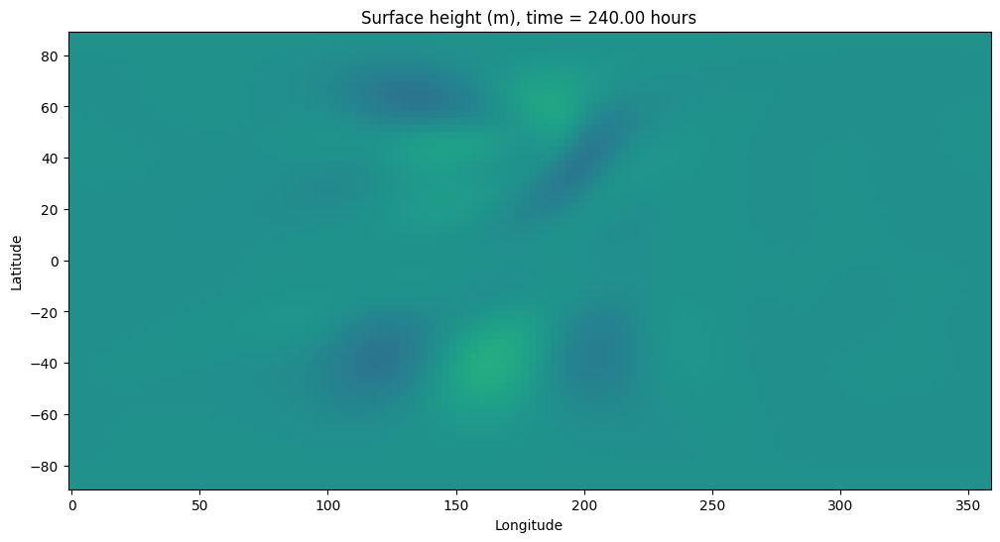

In [24]:
# create a figure and axes
fig = plt.figure(figsize=(12,6))

# Create arrays with the latitude and longitude coordinates for plotting using pcolor
from dedalus.extras import plot_tools
(X, Y) = plot_tools.quad_mesh(np.squeeze(np.pi/2 - theta)*360/2/np.pi, np.squeeze(phi)*360/2/np.pi)

# Define an animation function
def drawframe(n):
    plt.clf()
    height = plt.pcolor(Y, X, h_save[n,:,:], vmin=-0.1, vmax=0.1)
    # Specify the axis limits and labels
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Surface height (m), time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

## 4. Optional further investigations

* In the example of the shallow water equations on a sphere, introduce bathymetry by making $H$ a function of latitude and longitude. Make sure that you modify the equations in Dedalus appropriately. How do the waves behave when they encounter shallow water (e.g. a localized seamount)?

* It is quite difficult to simulate changing sea level (sometimes called wetting and drying), which is why the examples above do not include land. However, we can estimate the distance that a Tsunami will propagate using physical and dimensional arguments. Consider, for example, a flat, sloping beach. In the absence of energy dissipation, estimate the distance that a wave will propagate onshore. How could you modify this estimate to include energy dissipation (or drag)?